In [ ]:
!nvidia-smi

Tue May  7 03:59:35 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Clone and Install

**NOTE:** YOLOv9 is very new. At the moment, we recommend using a fork of the main repository. The `detect.py` script contains a bug that prevents inference. This bug is patched in the fork.

In [ ]:
!git clone https://github.com/SkalskiP/yolov9.git
%cd yolov9
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 325, done.
remote: Counting objects: 100% (216/216), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 325 (delta 158), reused 155 (delta 155), pack-reused 109
Receiving objects: 100% (325/325), 2.23 MiB | 13.95 MiB/s, done.
Resolving deltas: 100% (165/165), done.
/content/yolov9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.7 MB/s eta 0:00:00


**NOTE:** Let's install additional packages that will be useful later on.

In [ ]:
!pip install -q roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.5 MB/s eta 0:00:00


## Imports

In [ ]:
import roboflow

from IPython.display import Image

## Download model weights

**NOTE:** In the YOLOv9 paper, versions yolov9-s and yolov9-m are also mentioned, but the weights for these models are not yet available in the YOLOv9 repository.

In [ ]:
!mkdir -p {HOME}/weights

In [ ]:
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt

In [ ]:
!ls -la {HOME}/weights

total 402440
drwxr-xr-x 2 root root      4096 May  7 04:14 .
drwxr-xr-x 1 root root      4096 May  7 04:14 ..
-rw-r--r-- 1 root root  51508261 Feb 18 12:36 gelan-c.pt
-rw-r--r-- 1 root root 117203713 Feb 18 12:36 gelan-e.pt
-rw-r--r-- 1 root root 103153312 Feb 18 12:36 yolov9-c.pt
-rw-r--r-- 1 root root 140217688 Feb 18 12:36 yolov9-e.pt


## Download example data

In [ ]:
!mkdir -p {HOME}/data

In [ ]:
SOURCE_IMAGE_PATH = "/content/IMG20240303105743.jpg"

## Detection with pre-trained COCO model

### gelan-c

In [ ]:
!python detect.py --weights {HOME}/weights/gelan-c.pt --conf 0.1 --source /content/yolov9/IMG20240303105743.jpg --device 0

detect: weights=['/content/weights/gelan-c.pt'], source=/content/yolov9/IMG20240303105743.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 467 layers, 25472640 parameters, 0 gradients, 102.8 GFLOPs
image 1/1 /content/yolov9/IMG20240303105743.jpg: 640x480 (no detections), 233.3ms
Speed: 0.7ms pre-process, 233.3ms inference, 88.0ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


**NOTE:** By default, the results of each subsequent inference sessions are saved in `{HOME}/yolov9/runs/detect/`, in directories named `exp`, `exp2`, `exp3`, ... You can override this behavior by using the `--name` parameter.

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/detect/exp4/", width=600)

ValueError: Cannot embed the '/content/yolov9/runs/detect/exp2/' image format

## yolov9-e

In [ ]:
!python detect.py --weights {HOME}/weights/yolov9-e.pt --conf 0.1 --source /content/yolov9/IMG20240303105743.jpg --device 0

detect: weights=['/content/weights/yolov9-e.pt'], source=/content/yolov9/IMG20240303105743.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 1119 layers, 69470144 parameters, 0 gradients, 244.0 GFLOPs
image 1/1 /content/yolov9/IMG20240303105743.jpg: 640x480 1 person, 1 toilet, 174.5ms
Speed: 0.7ms pre-process, 174.5ms inference, 653.6ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


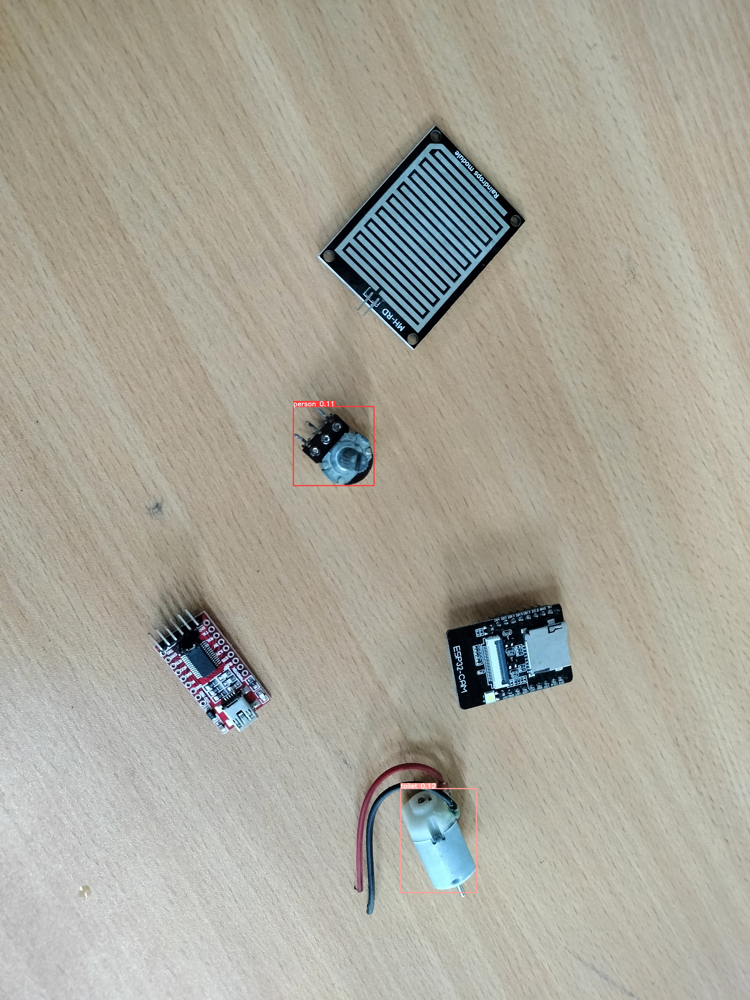

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/detect/exp3/IMG20240303105743.jpg", width=600)

## Authenticate and Download the Dataset

**NOTE:** The dataset must be saved inside the `{HOME}/yolov9` directory, otherwise, the training will not succeed.

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="tl44hGdKoh1F94o5HO3g")
project = rf.workspace("datasetsynthesis").project("electrocom-61")
version = project.version(5)
dataset = version.download("yolov9")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ElectroCom-61-5 in yolov9:: 100%|██████████| 4154/4154 [00:01<00:00, 3464.18it/s]


## Train Custom Model

In [ ]:
%cd {HOME}/yolov9

!python train.py \
--batch 8 --epochs 25 --img 640 --device 0 --min-items 0 --close-mosaic 15 \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/gelan-c.pt \
--cfg models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml

/content/yolov9
2024-05-07 04:46:43.029903: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-07 04:46:43.029964: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-07 04:46:43.031948: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-07 04:46:45.532156: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=/content/weights/gelan-c.pt, cfg=models/detect/gelan-c.yaml, data=/content/yolov9/ElectroCom-61-5/data.yaml, hyp=hyp.scratch-high.yaml, epochs=25, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False

## Examine Training Results

In [ ]:
dic = {
    "1-5-Volt-Battery": 0.987,
    "3-3-Volt-Battery": 0.97,
    "7-Segment-Display": 0.965,
    "9-Volt-Battery": 0.991,
    "Arduino-Mega": 0.994,
    "Arduino-Nano": 0.981,
    "Arduino-Uno": 0.967,
    "BJT-Transistor": 0.839,
    "Bluetooth-Module": 0.995,
    "Breadboard": 0.986,
    "Bridge-Rectifier": 0.995,
    "Buck-Converter": 0.995,
    "Buzzer": 0.9,
    "Capacitor-10mf": 0.963,
    "Capacitor-470mf": 0.985,
    "DC-Motor": 0.995,
    "Diode": 0.965,
    "ESP32": 0.995,
    "ESP32-CAM": 0.97,
    "FT-232-USB-Serial-Module": 0.947,
    "Film-Capacitor": 0.994,
    "Fuse": 0.983,
    "Fuse-Base": 0.974,
    "GSM-Module": 0.995,
    "Gas-Sensor": 0.993,
    "Heat-Sink": 0.992,
    "High-Voltage-Ceramic-Capacitor": 0.995,
    "Humidity-Sensor": 0.995,
    "IC-Base-14-Pin": 0.995,
    "IC-Base-28-Pin": 0.995,
    "IC-Chip": 0.9,
    "IGBT": 0.943,
    "IR-Sensor": 0.988,
    "Inductor": 0.962,
    "Keypad": 0.848,
    "LCD-Display": 0.961,
    "LDR-Sensor": 0.961,
    "LED-Light": 0.995,
    "Low-Voltage-Ceramic-Capacitor": 0.735,
    "MLC-Capacitor": 0.948,
    "MOSFET": 0.936,
    "Motion-Sensor": 0.995,
    "Motor-Driver": 0.985,
    "NTC-Thermistor": 0.928,
    "OLED-Display": 0.995,
    "Pin-Header": 0.892,
    "Push-Switch": 0.899,
    "RFID-Scanner": 0.995,
    "Raindrops-Module": 0.995,
    "Relay-Module": 0.995,
    "Resistor": 0.995,
    "Rocker-Switch": 0.98,
    "Servo-Motor": 0.973,
    "Soil-Moisture-Sensor": 0.985,
    "Sonar-Sensor": 0.982,
    "TCRT5000": 0.916,
    "Tact-Switch": 0.813,
    "Taper-Potentiometer": 0.957,
    "Trimmer-Potentiometer": 0.934,
    "Water-Sensor": 0.995,
    "Zener-Diode": 0.837
}

sorted_dic = dict(sorted(dic.items(), key=lambda item: item[1]))
print(sorted_dic)


{'Low-Voltage-Ceramic-Capacitor': 0.735, 'Tact-Switch': 0.813, 'Zener-Diode': 0.837, 'BJT-Transistor': 0.839, 'Keypad': 0.848, 'Pin-Header': 0.892, 'Push-Switch': 0.899, 'Buzzer': 0.9, 'IC-Chip': 0.9, 'TCRT5000': 0.916, 'NTC-Thermistor': 0.928, 'Trimmer-Potentiometer': 0.934, 'MOSFET': 0.936, 'IGBT': 0.943, 'FT-232-USB-Serial-Module': 0.947, 'MLC-Capacitor': 0.948, 'Taper-Potentiometer': 0.957, 'LCD-Display': 0.961, 'LDR-Sensor': 0.961, 'Inductor': 0.962, 'Capacitor-10mf': 0.963, '7-Segment-Display': 0.965, 'Diode': 0.965, 'Arduino-Uno': 0.967, '3-3-Volt-Battery': 0.97, 'ESP32-CAM': 0.97, 'Servo-Motor': 0.973, 'Fuse-Base': 0.974, 'Rocker-Switch': 0.98, 'Arduino-Nano': 0.981, 'Sonar-Sensor': 0.982, 'Fuse': 0.983, 'Capacitor-470mf': 0.985, 'Motor-Driver': 0.985, 'Soil-Moisture-Sensor': 0.985, 'Breadboard': 0.986, '1-5-Volt-Battery': 0.987, 'IR-Sensor': 0.988, '9-Volt-Battery': 0.991, 'Heat-Sink': 0.992, 'Gas-Sensor': 0.993, 'Arduino-Mega': 0.994, 'Film-Capacitor': 0.994, 'Bluetooth-Modul

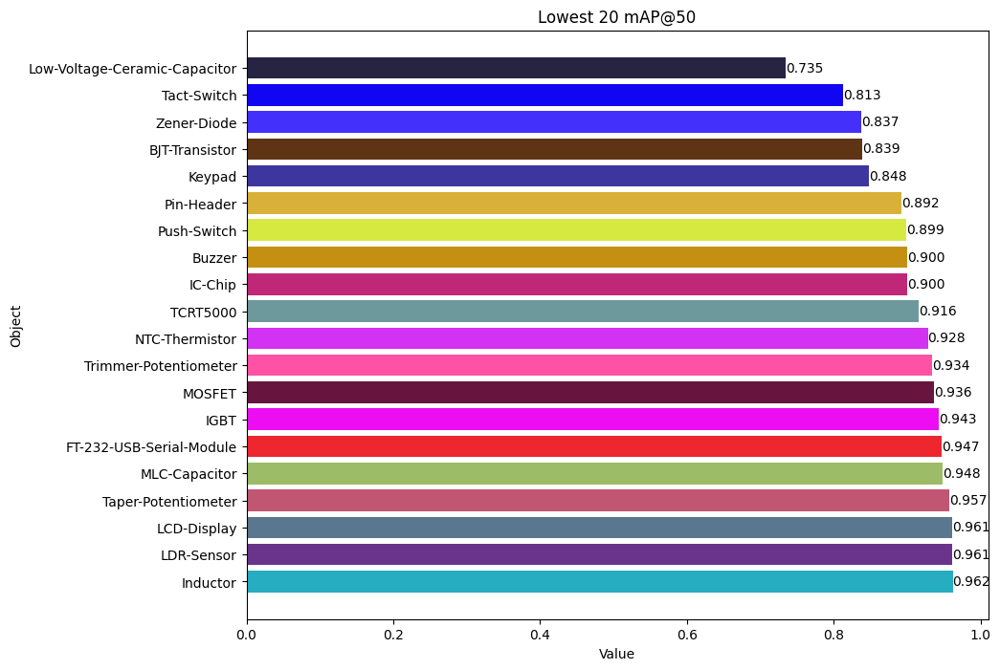

In [ ]:
dic_sort = {
    'Low-Voltage-Ceramic-Capacitor': 0.735,
    'Tact-Switch': 0.813,
    'Zener-Diode': 0.837,
    'BJT-Transistor': 0.839,
    'Keypad': 0.848,
    'Pin-Header': 0.892,
    'Push-Switch': 0.899,
    'Buzzer': 0.9,
    'IC-Chip': 0.9,
    'TCRT5000': 0.916,
    'NTC-Thermistor': 0.928,
    'Trimmer-Potentiometer': 0.934,
    'MOSFET': 0.936,
    'IGBT': 0.943,
    'FT-232-USB-Serial-Module': 0.947,
    'MLC-Capacitor': 0.948,
    'Taper-Potentiometer': 0.957,
    'LCD-Display': 0.961,
    'LDR-Sensor': 0.961,
    'Inductor': 0.962
}


import matplotlib.pyplot as plt
import numpy as np

# Extracting the first 20 items
first_20_items = list(dic_sort.items())[:20]

# Extracting keys and values
keys = [item[0] for item in first_20_items]
values = [item[1] for item in first_20_items]

# Generating random colors
colors = np.random.rand(20, 3)

# Plotting
plt.figure(figsize=(10, 8))
bars = plt.barh(keys, values, color=colors)

# Adding the values beside the bars
for bar, value in zip(bars, values):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{value:.3f}',
             va='center', ha='left', fontsize=10)

plt.xlabel('Value')
plt.ylabel('Object')
plt.title('Lowest 20 mAP@50')
plt.gca().invert_yaxis()  # Invert y-axis to display the object with the highest value on top
plt.show()


**NOTE:** By default, the results of each subsequent training sessions are saved in `{HOME}/yolov9/runs/train/`, in directories named `exp`, `exp2`, `exp3`, ... You can override this behavior by using the `--name` parameter.

In [ ]:
!ls {HOME}/yolov9/runs/train/exp/

confusion_matrix.png				    PR_curve.png	   val_batch0_pred.jpg
events.out.tfevents.1713586983.7ed814ab62e7.1813.0  R_curve.png		   val_batch1_labels.jpg
F1_curve.png					    results.csv		   val_batch1_pred.jpg
hyp.yaml					    results.png		   val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg	   val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg	   weights
opt.yaml					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


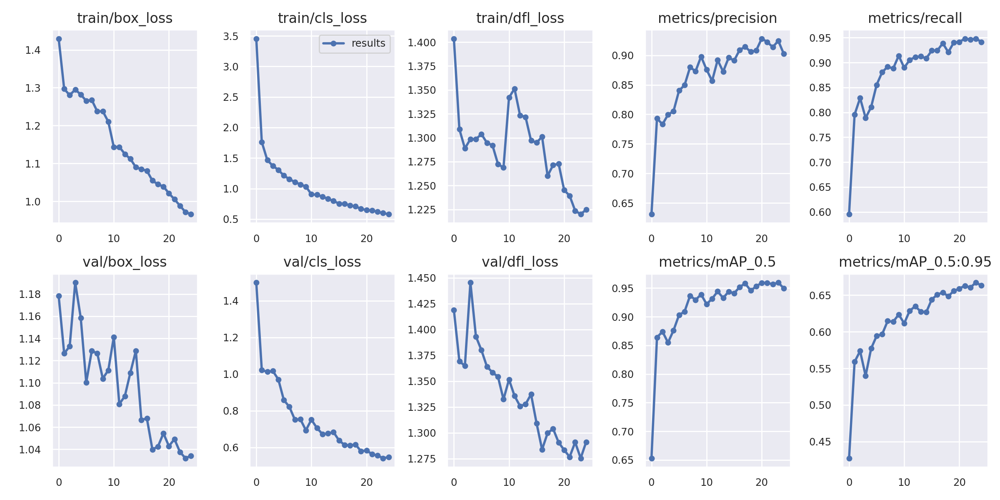

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp/results.png", width=1000)

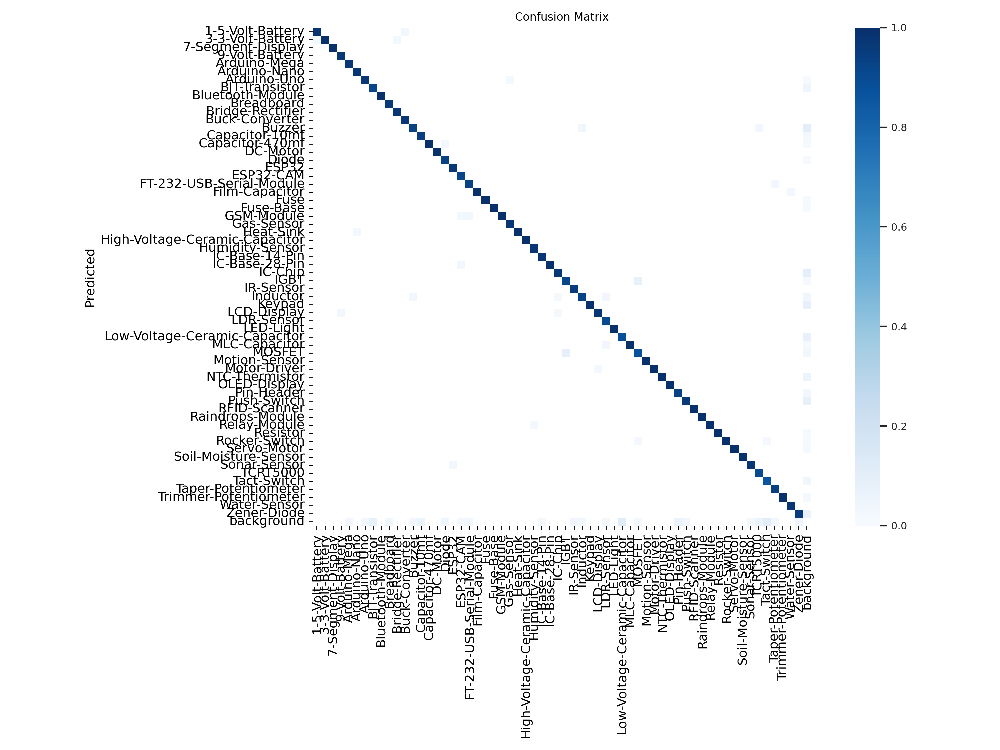

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp/confusion_matrix.png", width=1000)

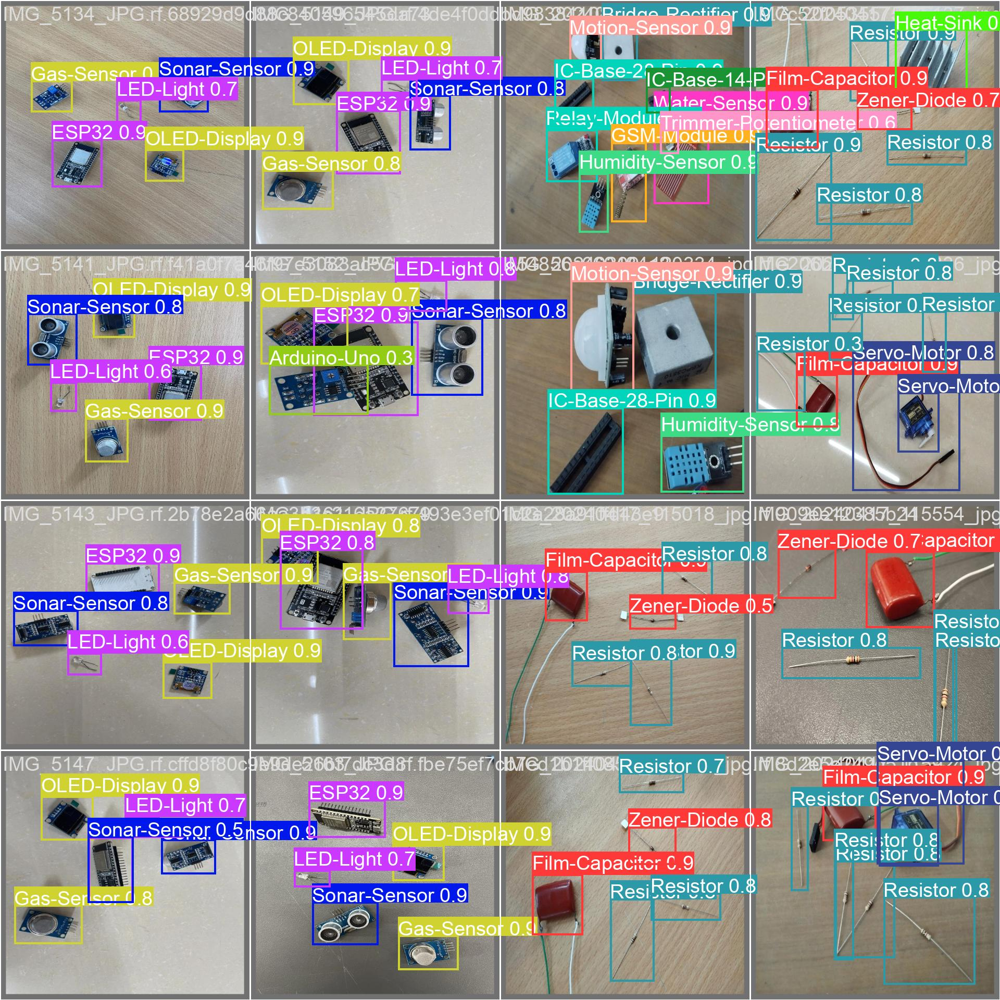

In [ ]:
Image(filename=f"{HOME}/yolov9/runs/train/exp/val_batch0_pred.jpg", width=1000)

## Validate Custom Model

In [ ]:
%cd {HOME}/yolov9

!python val.py \
--img 640 --batch 8 --conf 0.001 --iou 0.7 --device 0 \
--data {dataset.location}/data.yaml \
--weights {HOME}/yolov9/runs/train/exp/weights/best.pt

/content/yolov9
val: data=/content/yolov9/ElectroCom-60-5/data.yaml, weights=['/content/yolov9/runs/train/exp/weights/best.pt'], batch_size=8, imgsz=640, conf_thres=0.001, iou_thres=0.7, max_det=300, task=val, device=0, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False, min_items=0
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25457991 parameters, 0 gradients, 102.7 GFLOPs
val: Scanning /content/yolov9/ElectroCom-60-5/valid/labels.cache... 412 images, 0 backgrounds, 0 corrupt: 100% 412/412 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Image

## Inference with Custom Model

In [ ]:
!python detect.py \
--img 640 --conf 0.2 --device 0 \
--weights {HOME}/yolov9/runs/train/exp/weights/best.pt \
--source {dataset.location}/valid/images

detect: weights=['/content/yolov9/runs/train/exp/weights/best.pt'], source=/content/yolov9/ElectroCom-60-5/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 1e33dbb Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 467 layers, 25457991 parameters, 0 gradients, 102.7 GFLOPs
image 1/412 /content/yolov9/ElectroCom-60-5/valid/images/IMG20240219113745_jpg.rf.24ab2b3967353601f81db24a6c5fd7b5.jpg: 640x640 2 Film-Capacitors, 1 Gas-Sensor, 1 LDR-Sensor, 4 MLC-Capacitors, 1 Motor-Driver, 2 Sonar-Sensors, 51.1ms
image 2/412 /content/yolov9/ElectroCom-60-5/valid/images/IMG20240219113846_jpg

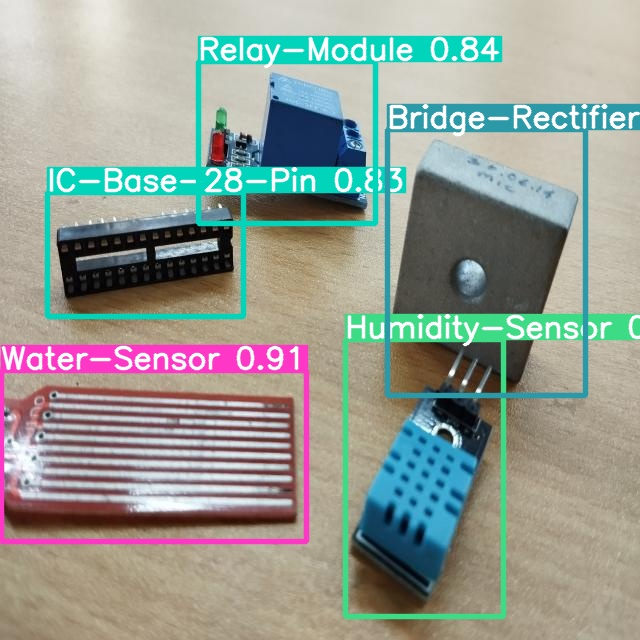

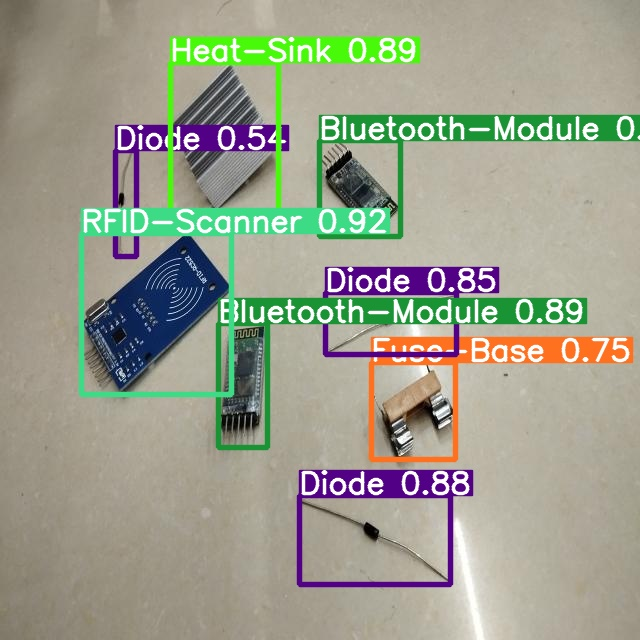

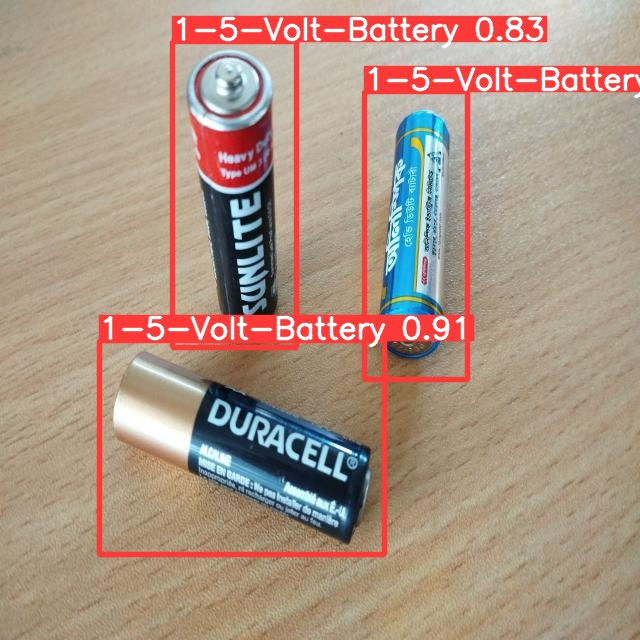

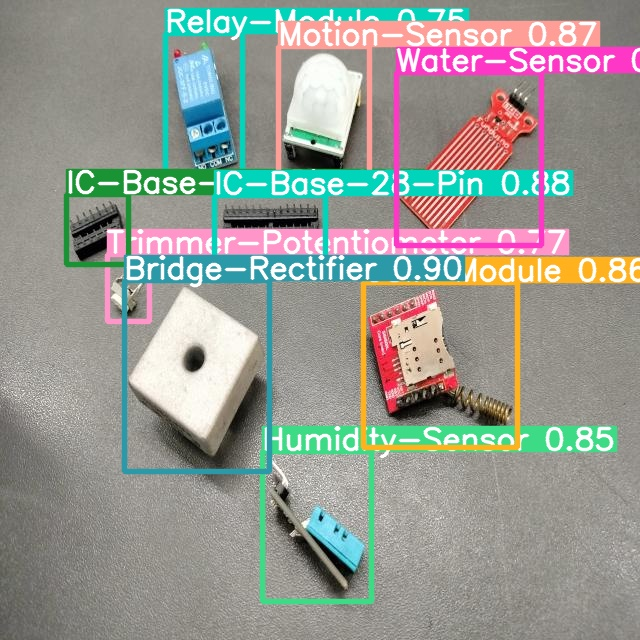

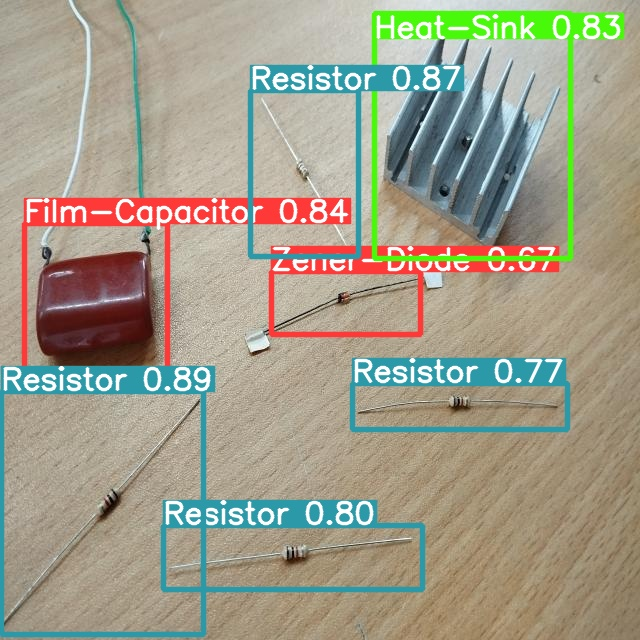

...

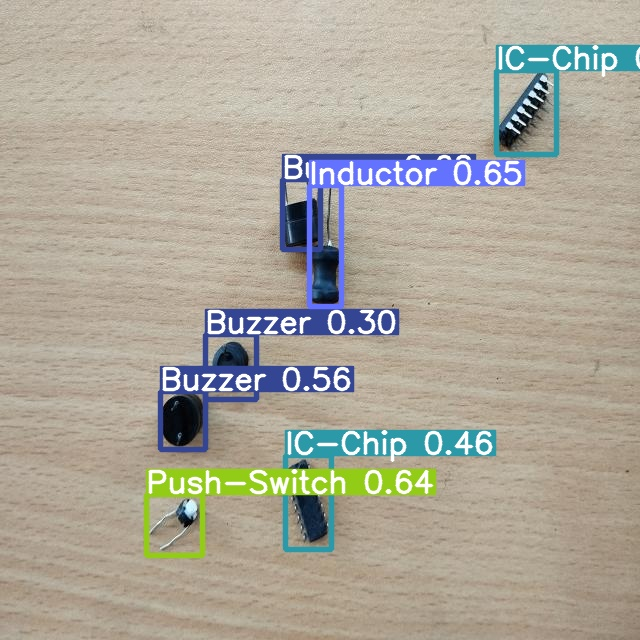

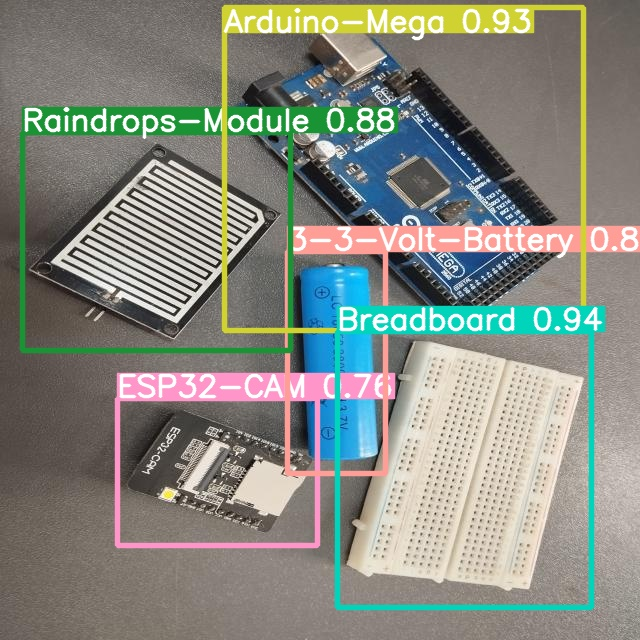

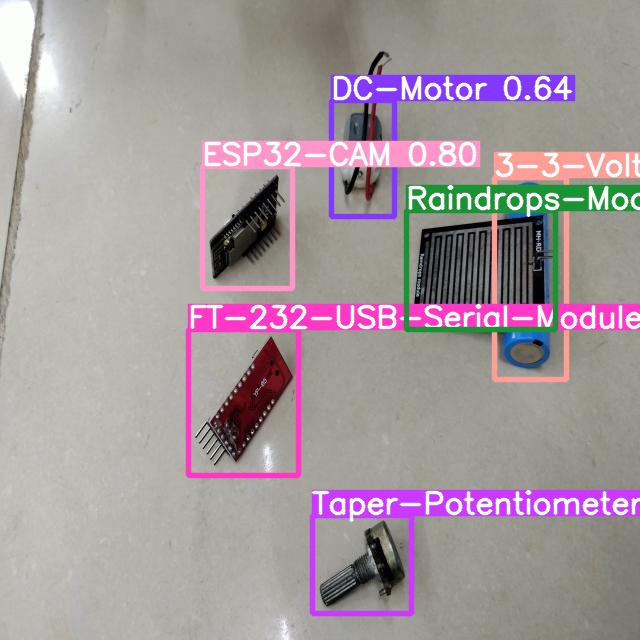

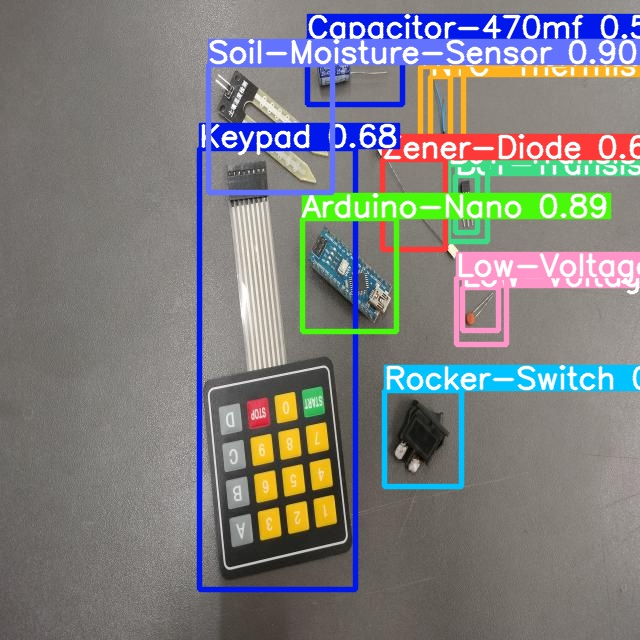

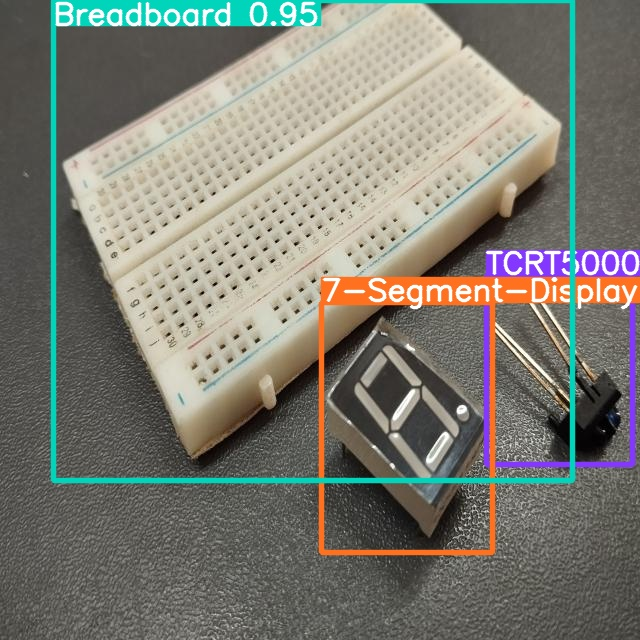

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/yolov9/runs/detect/exp/*.jpg')[:25]:
      display(Image(filename=image_path, width=600))
      print("\n")

keypad and servo motor (reanotation)

low voltage ceramic capacitor (lowest maP)

buzzer and inductor confusion

double labelling on nlc transistor


In [ ]:
!pip install patool
import patoolib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.0/96.0 kB 3.1 MB/s eta 0:00:00


In [ ]:
# Path to the folder you want to zip
folder_path = '/content/yolov9'

# Path where you want to save the zip file
zip_file_path = '/content/yolov9.zip'

# Zip the folder
patoolib.make_archive(zip_file_path, 'zip', folder_path)

AttributeError: module 'patoolib' has no attribute 'make_archive'

In [ ]:
import zipfile
import os

def zip_folder(folder_path, zip_file_path):
    with zipfile.ZipFile(zip_file_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Iterate over all the files in the folder
        for root, _, files in os.walk(folder_path):
            for file in files:
                # Create the full file path
                file_path = os.path.join(root, file)
                # Add the file to the zip
                zipf.write(file_path, os.path.relpath(file_path, folder_path))

# Path to the folder you want to zip
folder_path = '/content/yolov9'

# Path where you want to save the zip file
zip_file_path = '/content/yolov9.zip'

# Zip the folder
zip_folder(folder_path, zip_file_path)


In [ ]:
%cd {HOME}/yolov9

!python train.py \
--batch 8 --epochs 25 --img 640 --device 0 --min-items 0 --close-mosaic 15 \
--data {dataset.location}/data.yaml \
--weights {HOME}/weights/yolov9-e.pt \
--cfg models/detect/yolov9-e.yaml \
--hyp hyp.scratch-high.yaml